<h3>Given:</h3>
The actual concrete compressive strength (MPa) for a given mixture under a
specific age (days) was determined from laboratory. Data is in raw form (not
scaled). The data has 8 quantitative input variables, and 1 quantitative output
variable, and 1030 instances (observations).
<h3>Objective:</h3>
Modeling of strength of high performance concrete using Machine Learning

<h2>1. Reading the data</h2>

In [1]:
# Importing the libraries
import pandas as pd        # for data manipulation
import seaborn as sns      # for statistical data visualisation
import numpy as np         # for linear algebra
import matplotlib.pyplot as plt      # for data visualization
from scipy import stats        # for calculating statistics

# Importing various machine learning algorithm from sklearn

from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score,KFold
from sklearn.metrics import mean_absolute_error,roc_curve,auc,accuracy_score,mean_squared_error,r2_score
from scipy.stats import zscore
from sklearn.svm import SVR
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from surprise import Reader,Dataset,SVD,accuracy,KNNWithMeans
from surprise.model_selection import train_test_split,GridSearchCV
from collections import defaultdict

In [2]:
dataframe= pd.read_csv("ratings_Electronics.csv")  # Reading the data
dataframe.head()   # showing first 5 datas

,AKM1MP6P0OYPR,0132793040,5.0,1365811200
0,A2CX7LUOHB2NDG,0321732944,5.0,1341100800
1,A2NWSAGRHCP8N5,0439886341,1.0,1367193600
2,A2WNBOD3WNDNKT,0439886341,3.0,1374451200
3,A1GI0U4ZRJA8WN,0439886341,1.0,1334707200
4,A1QGNMC6O1VW39,0511189877,5.0,1397433600


Looks like the data doesnot have the header<br>
So giving our own header.

In [3]:
dataframe.columns=['uid','pid','rating','time']
dataframe.head()

,uid,pid,rating,time
0,A2CX7LUOHB2NDG,0321732944,5.0,1341100800
1,A2NWSAGRHCP8N5,0439886341,1.0,1367193600
2,A2WNBOD3WNDNKT,0439886341,3.0,1374451200
3,A1GI0U4ZRJA8WN,0439886341,1.0,1334707200
4,A1QGNMC6O1VW39,0511189877,5.0,1397433600


In [4]:
dataframe.shape

(7824481, 4)

The data given has  4 columns and consist of 7824481 data. And all the data is read correctly.<br>
There are 4 independent variables

In [5]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7824481 entries, 0 to 7824480
Data columns (total 4 columns):
uid       object
pid       object
rating    float64
time      int64
dtypes: float64(1), int64(1), object(2)
memory usage: 238.8+ MB


<h3>Obv</h3>
    The above information shows the following<br>
    a. uid and pid are objects we can convert it into strings<br>
    b. The rating is float attribute and time is int<br>
    <br>
       


In [6]:
dataframe['uid'].astype('str')
dataframe['pid'].astype('str')

0          0321732944
1          0439886341
2          0439886341
3          0439886341
4          0511189877
              ...    
7824476    BT008UKTMW
7824477    BT008UKTMW
7824478    BT008UKTMW
7824479    BT008UKTMW
7824480    BT008V9J9U
Name: pid, Length: 7824481, dtype: object

In [7]:
dataframe.isnull().sum()

uid       0
pid       0
rating    0
time      0
dtype: int64

There are no missing values. 

In [8]:
dataframe.apply(lambda x: len(x.unique()))

uid       4201696
pid        476001
rating          5
time         5489
dtype: int64

From above infprmation we can see that:<br>
a. There are 4201696 users.<br>
b. 476001 products.<br>
c. 5 ratings.<br>

In [9]:
dataframe.describe()

,rating,time
count,7.824481e+06,7.824481e+06
mean,4.012337e+00,1.338178e+09
std,1.380910e+00,6.900426e+07
min,1.000000e+00,9.127296e+08
25%,3.000000e+00,1.315354e+09
50%,5.000000e+00,1.361059e+09
75%,5.000000e+00,1.386115e+09
max,5.000000e+00,1.406074e+09


<h3>We can infer that:</h3>
We can see that both rating and time are left skewed.<br>





In [10]:
dataframe.skew()

rating   -1.205397
time     -1.921830
dtype: float64

There is no outliers in Cement data.

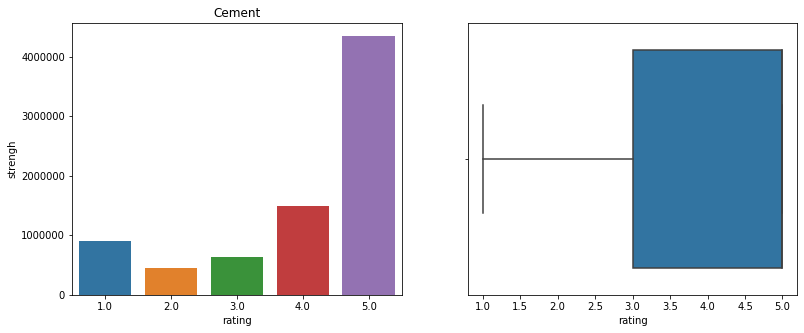

In [11]:
fig,(a1,a2)=plt.subplots(1,2,figsize=(13,5))

sns.countplot(dataframe.rating,ax=a1)
a1.set_title('Cement')
a1.set_ylabel('strengh')
sns.boxplot(x='rating',data=dataframe,ax=a2)


In [12]:
rating_info=pd.DataFrame(dataframe.groupby('pid').rating.mean())
rating_info['count']=pd.DataFrame(dataframe.groupby('pid').rating.count())

In [13]:
rating_info[rating_info['count']==rating_info['count'].max()]

,rating,count
pid,,
B0074BW614,4.491504,18244


In [14]:
rating_info.info()

<class 'pandas.core.frame.DataFrame'>
Index: 476001 entries, 0321732944 to BT008V9J9U
Data columns (total 2 columns):
rating    476001 non-null float64
count     476001 non-null int64
dtypes: float64(1), int64(1)
memory usage: 10.9+ MB


In [15]:
rating_info.describe()

,rating,count
count,476001.000000,476001.000000
mean,3.889698,16.437951
std,1.128719,112.702749
min,1.000000,1.000000
25%,3.272727,1.000000
50%,4.000000,2.000000
75%,5.000000,7.000000
max,5.000000,18244.000000


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7efc403a6ef0>],
      dtype=object)

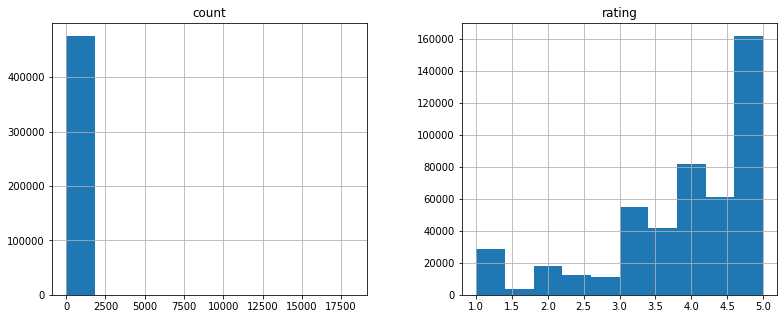

In [16]:
fig,(a1,a2)=plt.subplots(1,2,figsize=(13,5))
rating_info.hist(column='count',ax=a1)
rating_info.hist(column='rating',ax=a2)

In [17]:
q3=rating_info.rating.describe()['75%']
q1=rating_info.rating.describe()['25%']
iqr=q3-q1
print('Upper outliers starts from',q3+1.5*iqr)
print('Lower outliers starts from',q1-1.5*iqr)

Upper outliers starts from 7.590909090909091
Lower outliers starts from 0.6818181818181821


In [18]:
print('Number of Upper outliers are : ',rating_info[rating_info.rating>7.590909090909091].rating.count())
print('Number of Lower outliers are : ',rating_info[rating_info.rating<0.6818181818181821].rating.count())

Number of Upper outliers are :  0
Number of Lower outliers are :  0


We can see there are no outliers but rating is skewed.

In [19]:
print('Arranging the data :')
rating_info.sort_values(ascending=False,by='rating').sort_values(ascending=False,by='count').head()

Arranging the data :


,rating,count
pid,,
B0074BW614,4.491504,18244
B00DR0PDNE,3.931020,16454
B007WTAJTO,4.424005,14172
B0019EHU8G,4.754497,12285
B006GWO5WK,4.314657,12226


In [20]:
user_info=dataframe.uid.value_counts()
user_info.sort_values(ascending=True)

A1GUH62E7YVFC7      1
A3EWQZ8VU5W2RH      1
A2Z5ZKLQ1M8UKY      1
A3HF9YKJH1NYD9      1
A1Q8F1IAQKVXML      1
                 ... 
A680RUE1FDO8B     406
A6FIAB28IS79      431
A3OXHLG6DIBRW8    498
ADLVFFE4VBT8      501
A5JLAU2ARJ0BO     520
Name: uid, Length: 4201696, dtype: int64

Looks like there's lot of users who have given very few ratings. We may drop all users who have rated less than 50 times, as other users maynot contribute to recommedation system.<br>
By removing this the overhead can be removed.

In [21]:
df=dataframe[dataframe.uid.isin(user_info[user_info>=50].index)].copy()
print(df.shape)

(125871, 4)


In [22]:
df.uid.value_counts().sort_values(ascending=True)

A2TVJ0YDW3QO63     50
A1DSRM2P0WGQNS     50
A2F4HP0J5VNOYR     50
A17RFKCYS69M3Y     50
A2RGA7UGAN3UL7     50
                 ... 
A680RUE1FDO8B     406
A6FIAB28IS79      431
A3OXHLG6DIBRW8    498
ADLVFFE4VBT8      501
A5JLAU2ARJ0BO     520
Name: uid, Length: 1540, dtype: int64

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7efc402c93c8>],
      dtype=object)

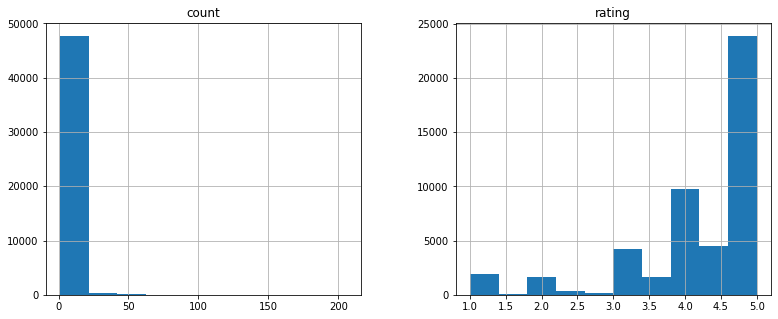

In [23]:
rating_info=pd.DataFrame(df.groupby('pid').rating.mean())
rating_info['count']=pd.DataFrame(df.groupby('pid').rating.count())
fig,(a1,a2)=plt.subplots(1,2,figsize=(13,5))
rating_info.hist(column='count',ax=a1)
rating_info.hist(column='rating',ax=a2)

Looks like we have good portion of users rating 5.<br>
And we have the good distribution of data as we have removed the users who have rated rarely.<br>
We are taking only 3 attributes user id, product id and rating, skipping time attribute as we dont require it now.

In [24]:
df1=df[['uid','pid','rating']]
df1

,uid,pid,rating
93,A3BY5KCNQZXV5U,0594451647,5.0
117,AT09WGFUM934H,0594481813,3.0
176,A32HSNCNPRUMTR,0970407998,1.0
177,A17HMM1M7T9PJ1,0970407998,4.0
491,A3CLWR1UUZT6TG,0972683275,5.0
...,...,...,...
7824425,A1E1LEVQ9VQNK,B00LGQ6HL8,5.0
7824426,A2NYK9KWFMJV4Y,B00LGQ6HL8,5.0
7824435,A3AYSYSLHU26U9,B00LI4ZZO8,4.0
7824437,A2NYK9KWFMJV4Y,B00LI4ZZO8,5.0


So now there are 125871 rows and 3 columns.

<h2>Converting the dataframe to format supported by surprise package</h2>

In [25]:
reader=Reader(rating_scale=(1, 5))
dataset=Dataset.load_from_df(df1[['uid', 'pid', 'rating']], reader)
dataset

<h3>Spliting the data into train and test test</h3>

In [26]:
train_s,test_s= train_test_split(dataset,test_size=.3,random_state=1)

<h3>Obv</h3>
<li>superplastic has multiple gaussians and rightly skewed.It shows the presence of outlies.</li>


<h3>Training the SVD model</h3>

In [27]:
algo=SVD()
algo.fit(train_s)

<h3>Testing the model </h3>

In [28]:
pred_svd=algo.test(test_s)
pred_svd

[Prediction(uid='A3PDWA32BAMB2Y', iid='B00CGW74YU', r_ui=5.0, est=4.012512984491358, details={'was_impossible': False}),
 Prediction(uid='A31BD4RXCON7QO', iid='B000P6G7YW', r_ui=1.0, est=4.239104166596112, details={'was_impossible': False}),
 Prediction(uid='A3J8A5L5AF5TX9', iid='B001GS8G06', r_ui=1.0, est=3.926081413495875, details={'was_impossible': False}),
 Prediction(uid='A3D6OI36USYOU1', iid='B000A1790S', r_ui=5.0, est=4.244852896532224, details={'was_impossible': False}),
 Prediction(uid='A3JU16JTNLVK1J', iid='B002CX16WO', r_ui=2.0, est=3.9992611377894103, details={'was_impossible': False}),
 Prediction(uid='A1ZU55TM45Y2R8', iid='B00HFAEBWG', r_ui=3.0, est=3.513586070382186, details={'was_impossible': False}),
 Prediction(uid='AYP0YPLSP9ISM', iid='B006Z0Q2SI', r_ui=3.0, est=3.964427372462098, details={'was_impossible': False}),
 Prediction(uid='A3UR2N0ATGBCU8', iid='B0024NL4DI', r_ui=5.0, est=4.399527766472862, details={'was_impossible': False}),
 Prediction(uid='A1PM7HH4F77NEH'

In [29]:
ac=accuracy.rmse(pred_svd)
ac

RMSE: 0.9855


0.9854602233382435

SVD accuracy is 98.56%

In [30]:
results = pd.DataFrame({'Method':['SVD'], 'RMSE': ac},index={'1'})
results = results[['Method', 'RMSE']]
results

,Method,RMSE
1,SVD,0.98546


<h3>Defining a method to return the next 5 data to each user</h3>

In [31]:
def n_top_values(pred,n):
    n_values=defaultdict(list)
    for uid,iid,r_ui,est,_ in pred:
        n_values[uid].append([iid,est])
    for uid,rating in n_values.items():
        rating.sort(key=lambda x: x[1], reverse=True)
        n_values[uid] = rating[:n]

    return n_values    

Diplaying top 5 recommendtions for each users as predicted by SVD

In [32]:
top_5 = n_top_values(pred_svd, n=5)
for uid,pid in top_5.items():
    items=[]
    print(uid,":" )
    [print(item,end=' ') for item,_ in pid]
    print('\n')
   

A3PDWA32BAMB2Y :
B004W2JKWG B000Q8UAWY B008DW95NA B003TXZCYE B000PNGM18 

A31BD4RXCON7QO :
B00009XVCZ B0011NVMO8 B00200K9NQ B00007E7JU B000G3KLPA 

A3J8A5L5AF5TX9 :
B001W28L2Y B000BQ7GW8 B0052SCU8U B001E0RZ3U B000QYWQW0 

A3D6OI36USYOU1 :
B003ES5ZUU B00AWBHFRI B0035ERKYW B001SJVU24 B002P5W4RU 

A3JU16JTNLVK1J :
B000HDFXU2 B001KN6WL2 B000Y16TY6 B000WL6YY8 B000IJY8DS 

A1ZU55TM45Y2R8 :
B008PQJWBE B00316263Y B004ZMV2GA B00006B81E B004D2AZ06 

AYP0YPLSP9ISM :
B006Z0Q2SI B000F7QRTG B0027ZGN2A B004JJM2N6 B005QWY3PU 

A3UR2N0ATGBCU8 :
B0095VPBM2 B009HP42HQ B004LNFJCQ B005869A16 B00471EYUU 

A1PM7HH4F77NEH :
B003XM1WE0 B005S0BYQ6 B004IZN3K2 B000BC2RHQ B001RNNX8K 

A1SFPA80X7TRBR :
B000QUUFRW B0002LEMWE B001U3Y6AQ B0041Q38NU B0024TNXNG 

A1AZQCVCDBQP6 :
B00E055H5O B0057UUB1G B000ANCPNM B000WH6H1M B005NGKR54 

A2DF62DP20RIXF :
B003XM1WE0 B00D349WB8 B000EWD4TS B002Y6CJJ8 B002SZEOLG 

A2JCJJNY43QQIV :
B006C248BC B002K9IHGI B003FGF2MC B005SNPTRS B003BLQHN4 

A3MMR2WDKAK0PA :
B00DVFLJDS B004H0OA7S B

<h3>Tuning SVD</h3>

In [33]:
params={
    "n_epochs":[5,10,15,20],
    "lr_all":[0.01,0.02,0.03,0.04],
    "reg_all":[0.01,0.02,0.03,0.04,0.05]
}
algo=SVD()
grid_SVD=GridSearchCV(SVD,params,measures=['rmse','mae'],cv=3)

Fitting the dataset

In [34]:
grid_SVD.fit(dataset)

Getting information of best attributes for our data

In [35]:
print(grid_SVD.best_score['rmse'])
print(grid_SVD.best_params['rmse'])

0.9850108998509041
{'n_epochs': 10, 'lr_all': 0.01, 'reg_all': 0.05}


Training the tunned SVD

In [36]:
t_svd=SVD(n_epochs=10,lr_all=0.01,reg_all=0.05,random_state=1)
t_svd.fit(train_s)
pred_svd_t=t_svd.test(test_s)
ac= accuracy.rmse(pred_svd_t)
ac                              

RMSE: 0.9837


0.9836857977536945

In [37]:
L_results = pd.DataFrame({'Method':['Tuned SVD'], 'RMSE': ac},index={'2'})
results=pd.concat([results,L_results])
results = results[['Method', 'RMSE']]
results

,Method,RMSE
1,SVD,0.985460
2,Tuned SVD,0.983686


Diplaying top 5 recommendtions for each users as predicted by tunned SVD

In [38]:
top_5 = n_top_values(pred_svd_t, n=5)
for uid,pid in top_5.items():
    items=[]
    print(uid,":" )
    [print(item,end=' ') for item,_ in pid]
    print('\n')
   

A3PDWA32BAMB2Y :
B004W2JKWG B000Q8UAWY B000PNGM18 B004V93M1A B008DW95NA 

A31BD4RXCON7QO :
B00009XVCZ B000VUIXOO B002KMIZIU B001KELVS0 B0031LX6F6 

A3J8A5L5AF5TX9 :
B0052SCU8U B000BQ7GW8 B0031ESKJA B001XURP7W B001W28L2Y 

A3D6OI36USYOU1 :
B003ES5ZUU B0035ERKYW B001SJVU24 B002P5W4RU B00AWBHFRI 

A3JU16JTNLVK1J :
B000IJY8DS B005K7192G B00009R6TA B000HDFXU2 B000WL6YY8 

A1ZU55TM45Y2R8 :
B008OEHPKM B00316263Y B003XIJ3MW B008ULPAT2 B008X9ZBVI 

AYP0YPLSP9ISM :
B000F7QRTG B006Z0Q2SI B004JJM2N6 B0086SDU3M B0027ZGN2A 

A3UR2N0ATGBCU8 :
B005869A16 B009HP42HQ B0095VPBM2 B00264NZWS B004LNFJCQ 

A1PM7HH4F77NEH :
B004IZN3K2 B003XM1WE0 B004R7A9NU B00080G0BK B005S0BYQ6 

A1SFPA80X7TRBR :
B000QUUFRW B0002LEMWE B000BM8RFM B001U3Y6AQ B004Q0T0LU 

A1AZQCVCDBQP6 :
B0057UUB1G B00E055H5O B005NGKR54 B003MTTJOY B000WH6H1M 

A2DF62DP20RIXF :
B003XM1WE0 B002Y6CJJ8 B00D349WB8 B000RHV46U B000AY2L3U 

A2JCJJNY43QQIV :
B002K9IHGI B005SNPTRS B00E9646MY B003FGF2MC B003BLQHN4 

A3MMR2WDKAK0PA :
B00DVFLJDS B001FWBUUG B

<h2> User-User Collaborative Filtering Model </h2> 

In [39]:
user_user=KNNWithMeans(k=25,sim_options={'name':'cosine', 'user-based':True})
user_user.fit(train_s)
u_pred=user_user.test(test_s)
ac=accuracy.rmse(u_pred)
ac

Computing the cosine similarity matrix...
Done computing similarity matrix.
RMSE: 1.0593


1.059307289421527

Accuracy is: 1.06

In [40]:
L_results = pd.DataFrame({'Method':['User-User'], 'RMSE': ac},index={'3'})
results=pd.concat([results,L_results])
results = results[['Method', 'RMSE']]
results

,Method,RMSE
1,SVD,0.985460
2,Tuned SVD,0.983686
3,User-User,1.059307


Diplaying top 5 recommendtions for each users as predicted by User-User Collaborative Filtering Model 

In [41]:
top_5 = n_top_values(u_pred, n=5)
for uid,pid in top_5.items():
    items=[]
    print(uid,":" )
    [print(item,end=' ') for item,_ in pid]
    print('\n')
   

A3PDWA32BAMB2Y :
B004W2JKWG B003XY6HYS B008DW95NA B000Q8UAWY B000PNGM18 

A31BD4RXCON7QO :
B000VUIXOO B0011NVMO8 B002CGSYNA B00009XVCZ B001KELVS0 

A3J8A5L5AF5TX9 :
B003LZ6F8M B005GI19HY B005S0BYQ6 B000V1O1J4 B0052SCU8U 

A3D6OI36USYOU1 :
B0009ST7DY B00AWBHFRI B0035ERKYW B003ES5ZUU B0001G6U4S 

A3JU16JTNLVK1J :
B000HDFXU2 B007PJ4PKK B004HR0M4Q B000V6MSRG B000IJY8DS 

A1ZU55TM45Y2R8 :
B00HZZZM1U B004SD1XB0 B00006B81E B0017H4G0A B00316263Y 

AYP0YPLSP9ISM :
B006Z0Q2SI B001HTE414 B004JWBQ4Y B00BEW8MVC B0078XGE3Y 

A3UR2N0ATGBCU8 :
B009HP42HQ B0095VPBM2 B000R9AAJA B003X26VV4 B005B3VO24 

A1PM7HH4F77NEH :
B005S0BYQ6 B003XM1WE0 B000BC2RHQ B003D3MFHM B00GIAOB10 

A1SFPA80X7TRBR :
B001FXZTIY B001U3Y6AQ B0024TNXNG B004Q0T0LU B0041Q38NU 

A1AZQCVCDBQP6 :
B0057UUB1G B005B5G4S6 B00E055H5O B005SEZBXY B00FEE7B1I 

A2DF62DP20RIXF :
B002Y6CJJ8 B004OX4HWG B0048HUNSK B002TTPC4Y B003XM1WE0 

A2JCJJNY43QQIV :
B003BLQHN4 B006C248BC B00E9646MY B002K9IHGI B003FGF2MC 

A3MMR2WDKAK0PA :
B009YKTR06 B005O81U9S B

<h3>Tuning User-User Collaborative Filtering Model </h3>

In [42]:
sim_options={
    "name":["msd","cosine","pearson_baseline"],
    "min_support":[25,50,75,100],
    "user_based":[True]
}
params={"sim_options":sim_options}
user_user_t=GridSearchCV(KNNWithMeans,params,measures=['rmse'],cv=3)

In [43]:
user_user_t.fit(dataset)

Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the cosine similarity matrix...
Done computing similarity matrix.
Computing the cosine similarity matrix...
Done c

In [44]:
print(user_user_t.best_score['rmse'])
print(user_user_t.best_params['rmse'])

1.0277037235321285
{'sim_options': {'name': 'pearson_baseline', 'min_support': 25, 'user_based': True}}


In [45]:
t_user=KNNWithMeans(k=25,sim_options={'name':'msd','user_based':True})
t_user.fit(train_s)
ut_pred=t_user.test(test_s)
ac=accuracy.rmse(ut_pred)
ac

Computing the msd similarity matrix...
Done computing similarity matrix.
RMSE: 1.0632


1.0632068133441974

In [46]:
L_results = pd.DataFrame({'Method':['Tunned User-User'], 'RMSE': ac},index={'4'})
results=pd.concat([results,L_results])
results = results[['Method', 'RMSE']]
results

,Method,RMSE
1,SVD,0.985460
2,Tuned SVD,0.983686
3,User-User,1.059307
4,Tunned User-User,1.063207


In [47]:
top_5 = n_top_values(ut_pred, n=5)
for uid,pid in top_5.items():
    items=[]
    print(uid,":" )
    [print(item,end=' ') for item,_ in pid]
    print('\n')
   

A3PDWA32BAMB2Y :
B004W2JKWG B003XY6HYS B008DW95NA B000Q8UAWY B000PNGM18 

A31BD4RXCON7QO :
B000VUIXOO B0011NVMO8 B00009XVCZ B000P6G7YW B00000JX3C 

A3J8A5L5AF5TX9 :
B003LZ6F8M B005GI19HY B005S0BYQ6 B000V1O1J4 B0052SCU8U 

A3D6OI36USYOU1 :
B0009ST7DY B00AWBHFRI B0035ERKYW B003ES5ZUU B0001G6U4S 

A3JU16JTNLVK1J :
B000HDFXU2 B007PJ4PKK B004HR0M4Q B000V6MSRG B000IJY8DS 

A1ZU55TM45Y2R8 :
B00HZZZM1U B004SD1XB0 B0017H4G0A B00006B81E B00316263Y 

AYP0YPLSP9ISM :
B006Z0Q2SI B00B46XUQU B001HTE414 B004JWBQ4Y B00BEW8MVC 

A3UR2N0ATGBCU8 :
B009HP42HQ B0095VPBM2 B003X26VV4 B000R9AAJA B005B3VO24 

A1PM7HH4F77NEH :
B005S0BYQ6 B003XM1WE0 B000BC2RHQ B003D3MFHM B00GIAOB10 

A1SFPA80X7TRBR :
B001FXZTIY B001U3Y6AQ B0024TNXNG B004Q0T0LU B0041Q38NU 

A1AZQCVCDBQP6 :
B0057UUB1G B005B5G4S6 B00E055H5O B00FEE7B1I B005SEZBXY 

A2DF62DP20RIXF :
B002Y6CJJ8 B002SZEOLG B00D349WB8 B004OX4HWG B0048HUNSK 

A2JCJJNY43QQIV :
B003BLQHN4 B006C248BC B003FGF2MC B00E9646MY B005SNPTRS 

A3MMR2WDKAK0PA :
B009YKTR06 B005O81U9S B

In [48]:
item_item=KNNWithMeans(k=25,sim_options={'name':'cosine', 'user-based':False})
item_item.fit(train_s)
u_pred=item_item.test(test_s)
ac=accuracy.rmse(u_pred)
ac

Computing the cosine similarity matrix...
Done computing similarity matrix.
RMSE: 1.0593


1.059307289421527

In [49]:
L_results = pd.DataFrame({'Method':['Item-Item'], 'RMSE': ac},index={'5'})
results=pd.concat([results,L_results])
results = results[['Method', 'RMSE']]
results

,Method,RMSE
1,SVD,0.985460
2,Tuned SVD,0.983686
3,User-User,1.059307
4,Tunned User-User,1.063207
5,Item-Item,1.059307


In [50]:
top_5 = n_top_values(u_pred, n=5)
for uid,pid in top_5.items():
    items=[]
    print(uid,":" )
    [print(item,end=' ') for item,_ in pid]
    print('\n')
   

A3PDWA32BAMB2Y :
B004W2JKWG B003XY6HYS B008DW95NA B000Q8UAWY B000PNGM18 

A31BD4RXCON7QO :
B000VUIXOO B0011NVMO8 B002CGSYNA B00009XVCZ B001KELVS0 

A3J8A5L5AF5TX9 :
B003LZ6F8M B005GI19HY B005S0BYQ6 B000V1O1J4 B0052SCU8U 

A3D6OI36USYOU1 :
B0009ST7DY B00AWBHFRI B0035ERKYW B003ES5ZUU B0001G6U4S 

A3JU16JTNLVK1J :
B000HDFXU2 B007PJ4PKK B004HR0M4Q B000V6MSRG B000IJY8DS 

A1ZU55TM45Y2R8 :
B00HZZZM1U B004SD1XB0 B00006B81E B0017H4G0A B00316263Y 

AYP0YPLSP9ISM :
B006Z0Q2SI B001HTE414 B004JWBQ4Y B00BEW8MVC B0078XGE3Y 

A3UR2N0ATGBCU8 :
B009HP42HQ B0095VPBM2 B000R9AAJA B003X26VV4 B005B3VO24 

A1PM7HH4F77NEH :
B005S0BYQ6 B003XM1WE0 B000BC2RHQ B003D3MFHM B00GIAOB10 

A1SFPA80X7TRBR :
B001FXZTIY B001U3Y6AQ B0024TNXNG B004Q0T0LU B0041Q38NU 

A1AZQCVCDBQP6 :
B0057UUB1G B005B5G4S6 B00E055H5O B005SEZBXY B00FEE7B1I 

A2DF62DP20RIXF :
B002Y6CJJ8 B004OX4HWG B0048HUNSK B002TTPC4Y B003XM1WE0 

A2JCJJNY43QQIV :
B003BLQHN4 B006C248BC B00E9646MY B002K9IHGI B003FGF2MC 

A3MMR2WDKAK0PA :
B009YKTR06 B005O81U9S B

<h2>Matrix Table</h2>

Filling the missing data (NaN) with 0.

In [51]:
matrix=df.pivot(index='uid',columns='pid',values='rating').fillna(0)
matrix

pid,0594451647,0594481813,0970407998,0972683275,1400501466,1400501520,1400501776,1400532620,1400532655,140053271X,...,B00L5YZCCG,B00L8I6SFY,B00L8QCVL6,B00LA6T0LS,B00LBZ1Z7K,B00LED02VY,B00LGN7Y3G,B00LGQ6HL8,B00LI4ZZO8,B00LKG1MC8
uid,,,,,,,,,,,,,,,,,,,,,
A100UD67AHFODS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A100WO06OQR8BQ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A105S56ODHGJEK,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A105TOJ6LTVMBG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A10AFVU66A79Y1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AZBXKUH4AIW3X,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AZCE11PSTCH1L,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AZMY6E8B52L2T,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [52]:
print('Popularity based recommender')
rating_info.sort_values(ascending=False,by='rating').sort_values(ascending=False,by='count').head()

Popularity based recommender


,rating,count
pid,,
B0088CJT4U,4.218447,206
B003ES5ZUU,4.864130,184
B000N99BBC,4.772455,167
B007WTAJTO,4.701220,164
B00829TIEK,4.436242,149


In [53]:
p_rates=matrix['B0088CJT4U']
similar_product=matrix.corrwith(p_rates).sort_values(ascending=False)
similar_product.head()

pid
B0088CJT4U    1.000000
B008DWCRQW    0.283052
B004CLYEDC    0.249330
B000N99BBC    0.230241
B004CLYEFK    0.204168
dtype: float64

In [54]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size = 0.30, random_state=1)
train.head()

,uid,pid,rating,time
4045823,AW63IRQWH10GF,B004DUMUA6,3.0,1322438400
5461879,A2D1ZQEFS1NBH2,B006QDYH9U,1.0,1330732800
1929769,AZNUHQSHZHSUE,B001DFZ5J2,4.0,1353110400
685543,A3VTOLNB5N6FVP,B0009U7XH4,5.0,1137024000
3461618,A17Z0LVY96TO53,B003MVZ60I,4.0,1315526400


In [55]:
train_group=train.groupby('pid').agg({'uid':'count'}).reset_index()
train_group_sorted=train_group.sort_values(['uid','pid'],ascending=[0,1])
train_group_sorted.rename(columns={'uid':'total_user'},inplace=True)

popularity_based_recommender=train_group_sorted.head()
popularity_based_recommender

In [56]:
popularity_based_recommender = train_group_sorted.head()
popularity_based_recommender

,pid,total_user
30797,B0088CJT4U,155
19529,B003ES5ZUU,124
8601,B000N99BBC,122
30194,B007WTAJTO,112
30489,B00829TIEK,100


In [57]:
def recommend(u_id):     
    user_recommendations = popularity_based_recommender
          
    #Add user_id column for which the recommendations are being generated 
    user_recommendations['uid'] = u_id 
      
    #Bring user_id column to the front 
    cols = user_recommendations.columns.tolist() 
    cols = cols[-1:] + cols[:-1] 
    user_recommendations = user_recommendations[cols] 
          
    return user_recommendations

In [61]:
find_recom = test.index   # This list is user choice.
for i in find_recom:
    
    print(recommend(i))    
    print("\n")

           uid         pid  total_user
30797  1476087  B0088CJT4U         155
19529  1476087  B003ES5ZUU         124
8601   1476087  B000N99BBC         122
30194  1476087  B007WTAJTO         112
30489  1476087  B00829TIEK         100


           uid         pid  total_user
30797  3043225  B0088CJT4U         155
19529  3043225  B003ES5ZUU         124
8601   3043225  B000N99BBC         122
30194  3043225  B007WTAJTO         112
30489  3043225  B00829TIEK         100


           uid         pid  total_user
30797  3337659  B0088CJT4U         155
19529  3337659  B003ES5ZUU         124
8601   3337659  B000N99BBC         122
30194  3337659  B007WTAJTO         112
30489  3337659  B00829TIEK         100


           uid         pid  total_user
30797  2560303  B0088CJT4U         155
19529  2560303  B003ES5ZUU         124
8601   2560303  B000N99BBC         122
30194  2560303  B007WTAJTO         112
30489  2560303  B00829TIEK         100


           uid         pid  total_user
30797  1725957  B

/home/amnayak/.local/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


           uid         pid  total_user
30797  1998393  B0088CJT4U         155
19529  1998393  B003ES5ZUU         124
8601   1998393  B000N99BBC         122
30194  1998393  B007WTAJTO         112
30489  1998393  B00829TIEK         100


           uid         pid  total_user
30797  2729202  B0088CJT4U         155
19529  2729202  B003ES5ZUU         124
8601   2729202  B000N99BBC         122
30194  2729202  B007WTAJTO         112
30489  2729202  B00829TIEK         100


           uid         pid  total_user
30797  2256242  B0088CJT4U         155
19529  2256242  B003ES5ZUU         124
8601   2256242  B000N99BBC         122
30194  2256242  B007WTAJTO         112
30489  2256242  B00829TIEK         100


           uid         pid  total_user
30797  2491440  B0088CJT4U         155
19529  2491440  B003ES5ZUU         124
8601   2491440  B000N99BBC         122
30194  2491440  B007WTAJTO         112
30489  2491440  B00829TIEK         100


           uid         pid  total_user
30797  2505650  B

We can see that the recommendations for each user is the same five products. That is so becasue each user gets recommended with the products which have had the top five average ratings, irrespective of what the users personal preferences are.

However the other models built prior to the popularity based model, try to identify the tastes of the user and find the products similar to it and recommend the products with highest similarity.

<h3>Hence if we want to build a recommemdation system which is able to recommend to the user, the products he/she may like to buy, popularity based recommendation system may not be the right idea.</h3>

<h3>Amongst the matrix based, SVD and Collaborative filtering, the model with best results must be chosen.</h3>